# Sprint 11

# Nivell 1

## 1. 
- Connecta Python amb MySQL Workbench i carrega les dades de la teva base de dades del Sprint 4 per utilitzar-les en tots els exercicis.



In [4]:
import mysql.connector
from mysql.connector import errorcode
import pandas as pd
import seaborn as sns
import datetime as datetime
import matplotlib.pyplot as plt 
import plotly.express as px
from dotenv import load_dotenv
import os
import warnings
warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid", palette="mako")

load_dotenv()

USER = os.getenv("USUARIO")
HOST = os.getenv("HOST")
PASS = os.getenv("PASSWORD")

def connection():
    try:
      sql_connection = mysql.connector.connect(user= USER, host=HOST, password = PASS,
                                database='modeling_3')
    except mysql.connector.Error as err:
      if err.errno == errorcode.ER_ACCESS_DENIED_ERROR:
        print("Something is wrong with your user name or password")
      elif err.errno == errorcode.ER_BAD_DB_ERROR:
        print("Database does not exist")
      else:
        print(err)
    return sql_connection
    
sql_connection = connection()


In [5]:
# Prueba de conexión
cursor = sql_connection.cursor(buffered=True)
query = ("SELECT company_name, phone FROM companies "
        "LIMIT 10")
cursor.execute(query)
for (company_name, phone) in cursor: 
    print("{}, {} ".format(company_name,phone))
sql_connection.close()

Ac Fermentum Incorporated, 06 85 56 52 33 
Magna A Neque Industries, 04 14 44 64 62 
Fusce Corp., 08 14 97 58 85 
Convallis In Incorporated, 06 66 57 29 50 
Ante Iaculis Nec Foundation, 08 23 04 99 53 
Donec Ltd, 01 25 51 37 37 
Sed Nunc Ltd, 02 62 64 73 48 
Amet Nulla Donec Corporation, 07 15 25 14 74 
Nascetur Ridiculus Mus Inc., 06 26 87 61 84 
Vestibulum Lorem PC, 02 02 87 33 40 


## 2. 
- Per a cada ítem, crea una visualització adequada segons les variables especificades. Interpreta els resultats segons les teves dades.
- Recorda: quan seleccionis les columnes, pensa sempre en el mètode que faràs servir i inclou les que calguin per a la funció de visualització que vulguis utilitzar.

- Una variable numèrica.
- Dues variables numèriques.
- Una variable categòrica.
- Una variable categòrica i una numèrica.
- Dues variables categòriques.
- Tres variables combinades.
- Crea un Pairplot.

In [7]:
sql_connection = connection()
query = ("SELECT * "
         "FROM transactions ")
data = pd.read_sql(query,sql_connection)
sql_connection.close()
data.head()

,id,card_id,business_id,timestamp,amount,declined,product_ids,lat,longitude
0,00043A49-2949-494B-A5DD-A5BAE3BB19DD,CcS-9294,b-2458,2024-08-28 07:16:46,395.43,0,"16, 26, 97, 87",46.1999,1.43554
1,000447FE-B650-4DCF-85DE-C7ED0EE1CAAD,CcS-5019,b-2370,2016-12-21 20:07:18,155.63,0,"66, 69, 87",41.5972,12.22180
2,00045D6B-ED2E-4F2F-8186-CEE074D875D0,CcS-6699,b-2390,2020-07-14 15:37:45,326.01,0,"30, 11, 16, 81",29.7573,-95.37960
3,000481C3-1C26-4FEF-83A0-4CD0EB004BBD,CcS-6696,b-2230,2017-09-04 19:44:53,161.60,0,72,53.5489,-113.50300
4,00051AA4-9CBE-4268-B070-C38062A1B3E2,CcS-7606,b-2266,2017-01-05 18:19:25,148.91,0,18,52.2084,5.69081


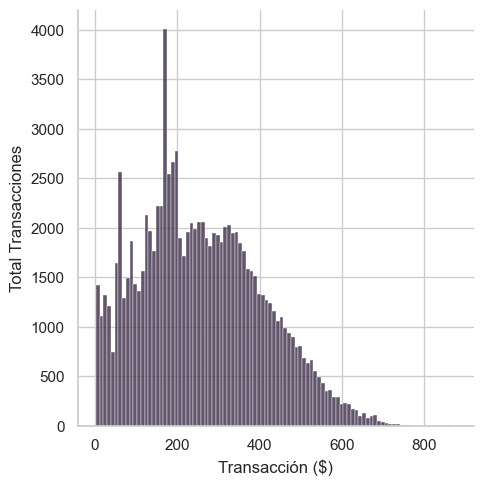

Podemos observar que hay una mayor cantidad de transacciones alrededor de los 170$


In [8]:

# Una variable numèrica.
sns.displot(x=data["amount"])
plt.ylabel("Total Transacciones")
plt.xlabel("Transacción ($)") 

plt.show()
print("Podemos observar que hay una mayor cantidad de transacciones alrededor de los 170$")

In [9]:
fig = px.histogram(data, x=data["amount"], hover_data=data.columns, template= 'simple_white')
fig.show()

In [10]:
# Dues variables numèriques.
sql_connection = connection()
query_02 = ("SELECT COUNT(products.id) as products, amount "
            "FROM products "
            "JOIN trans_prods "
            "ON id = product_id "
            "JOIN transactions "
            "ON transactions_id = transactions.id "
            "GROUP BY amount "
            "ORDER BY amount")
data_02 = pd.read_sql(query_02,sql_connection)
sql_connection.close()
data_02

,products,amount
0,235,2.12
1,255,3.83
2,10,5.95
3,238,6.90
4,219,6.93
...,...,...
32600,5,825.14
32601,5,845.91
32602,5,858.55
32603,10,858.60


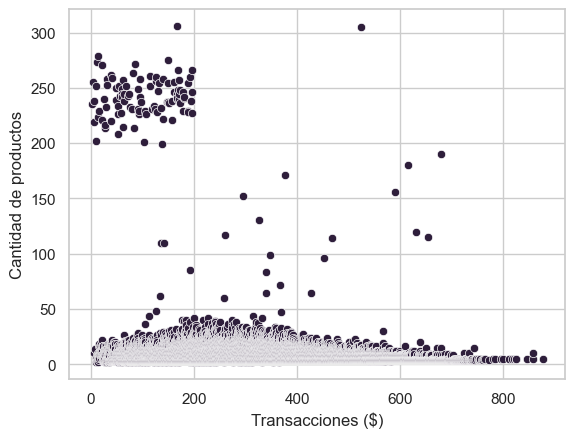

Podemos observar que se compran una mayor cantidad de productos en las transacciones de menos de 200$


In [11]:

sns.scatterplot(data_02, x="amount", y = "products")
plt.xlabel("Transacciones ($)")
plt.ylabel("Cantidad de productos") 
plt.show()

print("Podemos observar que se compran una mayor cantidad de productos en las transacciones de menos de 200$")

In [12]:
fig = px.scatter(data_02, x=data_02["amount"],y = data_02["products"], hover_data=data_02.columns, template= 'simple_white', color = "amount")
fig.show()

In [13]:
# Una variable categòrica.
sql_connection = connection()
query_03 = ("SELECT country "
            "FROM data_user")
data_03 = pd.read_sql(query_03, sql_connection)
sql_connection.close()
data_03.value_counts()

country       
United States     520
Canada            490
United Kingdom    478
Spain             461
Netherlands       455
Germany           452
Portugal          441
Italy             439
France            432
Sweden            417
Poland            415
Name: count, dtype: int64

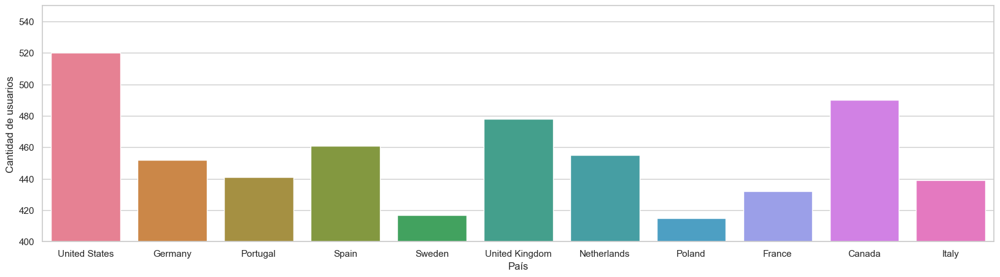

Observamos que Estados unidos, Canadá y Reino unido tienen una mayor cantidad de usuarios


In [14]:
plt.figure(figsize=(20,5))
sns.countplot(data = data_03, x = "country", hue = "country").set_ylim(bottom=400, top=550)
plt.xlabel("País")
plt.ylabel("Cantidad de usuarios") 
plt.show()
print("Observamos que Estados unidos, Canadá y Reino unido tienen una mayor cantidad de usuarios")

In [15]:
fig = px.histogram(data_03, x=data_03["country"], hover_data=data_03.columns, template= 'simple_white', color = "country", labels={"country":"País"})
fig.update(layout_yaxis_range = [400,550])
fig.show()

In [16]:
# Una variable categòrica i una numèrica.
sql_connection = connection()
query_04 = ("SELECT country, SUM(amount) as sales "
            "FROM data_user "
            "JOIN credit_cards "
            "ON data_user.id = user_id "
            "JOIN transactions "
            "ON credit_cards.id = card_id "
            "GROUP BY country")
data_04 = pd.read_sql(query_04, sql_connection)
sql_connection.close()
data_04

,country,sales
0,France,2175321.38
1,Italy,2238008.35
2,United States,3024977.71
3,Canada,2584178.24
4,Netherlands,2316227.02
5,United Kingdom,2478416.85
6,Portugal,2250608.19
7,Germany,2265471.24
8,Sweden,2089941.13
9,Poland,2141757.73


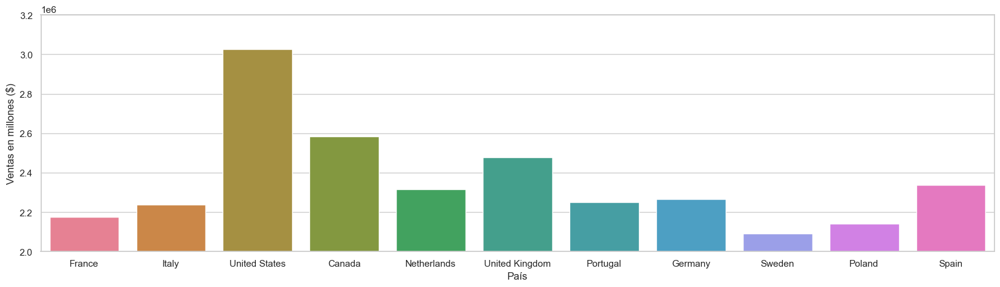

Vemos que las compras son mayores en Estados Unidos, Canadá y Reino Unido


In [17]:
plt.figure(figsize=(20,5))
sns.barplot(data = data_04, x = "country", y = "sales", hue = "country").set_ylim(bottom=2.0 * 1e6, top=3.2 * 1e6)
plt.xlabel("País")
plt.ylabel("Ventas en millones ($)") 
plt.show()
print("Vemos que las compras son mayores en Estados Unidos, Canadá y Reino Unido")

In [18]:
fig = px.bar(data_04, x=data_04["country"], y = data_04["sales"], hover_data=data_03.columns, template= 'simple_white', color = "country", labels={"country":"País", "sales":"Ventas($)"})
fig.update(layout_yaxis_range = [2.0 * 1e6,3.2 * 1e6])
fig.show()

In [19]:
# Dues variables categòriques.
sql_connection = connection()
query_05 = ("SELECT companies.country AS Company_Country, data_user.country AS Users_Country "
            "FROM companies "
            "JOIN transactions "
            "ON company_id = business_id "
            "JOIN credit_cards "
            "ON card_id = credit_cards.id "
            "JOIN data_user "
            "ON user_id = data_user.id ")
data_05 = pd.read_sql(query_05, sql_connection)
sql_connection.close()
data_05

,Company_Country,Users_Country
0,Netherlands,France
1,Sweden,Italy
2,Ireland,United States
3,United States,Canada
4,Sweden,Netherlands
...,...,...
99995,Germany,Germany
99996,United Kingdom,Portugal
99997,Germany,Sweden
99998,Italy,Netherlands


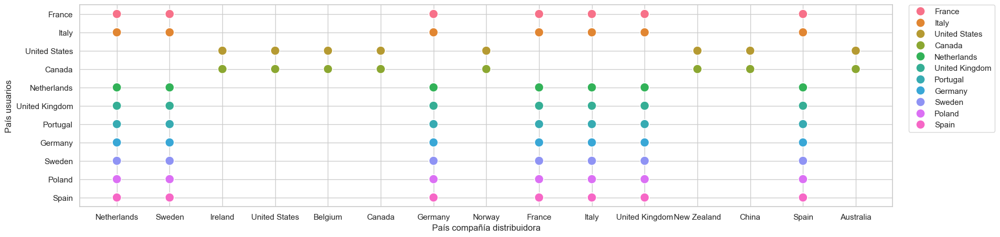

Observamos que los clientes de EEUU y Canada no compran en los mismos paises que los usuarios europeos


In [20]:
plt.figure(figsize=(20,5))
sns.scatterplot(data_05, x="Company_Country", y = "Users_Country", hue = "Users_Country", s = 150)
plt.xlabel("País compañía distribuidora")
plt.ylabel("País usuarios") 
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()
print("Observamos que los clientes de EEUU y Canada no compran en los mismos paises que los usuarios europeos")

In [21]:
fig = px.scatter(data_05, x=data_05["Company_Country"],y = data_05["Users_Country"], hover_data=data_05.columns, template= 'simple_white', color = "Users_Country",
                labels={"Company_Country":"País compañía distribuidora", "Users_Country":"País usuarios"})

fig.show()

In [22]:
# Tres variables combinades
sql_connection = connection()
query_06 = ("SELECT companies.country AS Company_Country, data_user.country AS Users_Country, SUM(amount) AS Ventas "
            "FROM companies "
            "JOIN transactions "
            "ON company_id = business_id "
            "JOIN credit_cards "
            "ON card_id = credit_cards.id "
            "JOIN data_user "
            "ON user_id = data_user.id "
           "GROUP BY Company_Country, Users_Country")
data_06 = pd.read_sql(query_06, sql_connection)
sql_connection.close()
data_06

,Company_Country,Users_Country,Ventas
0,Netherlands,France,417649.97
1,Sweden,Italy,478685.10
2,Ireland,United States,373667.64
3,United States,Canada,498716.61
4,Sweden,Netherlands,487791.64
...,...,...,...
74,Spain,Netherlands,43085.16
75,Spain,Spain,42729.32
76,Spain,Portugal,37564.18
77,France,United Kingdom,148906.62


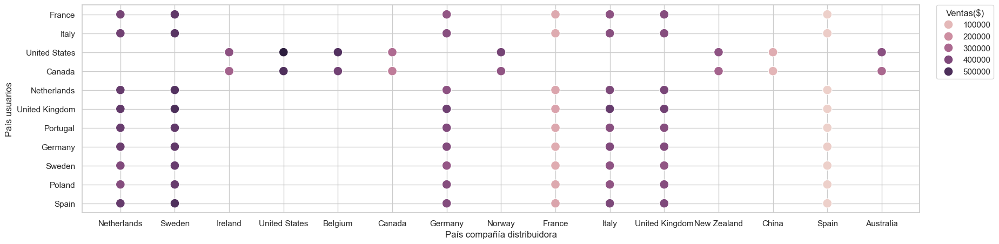

Podemos observar que los usuarios de Canadá compran mayoritariamente en Noruega, los portugueses en Suecia y los españoles en UK


In [23]:
plt.figure(figsize=(20,5))
sns.scatterplot(data_06, x="Company_Country", y = "Users_Country", hue="Ventas", s = 150)
plt.xlabel("País compañía distribuidora")
plt.ylabel("País usuarios") 
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title = "Ventas($)")
plt.show()
print("Podemos observar que los usuarios de Canadá compran mayoritariamente en Noruega, los portugueses en Suecia y los españoles en UK")

In [24]:
fig = px.scatter(data_06, x=data_06["Company_Country"],y = data_06["Users_Country"], hover_data=data_06.columns, template= 'simple_white', color = "Ventas",
                labels={"Company_Country":"País compañía distribuidora", "Users_Country":"País usuarios"})

fig.show()

In [158]:
# Crea un Pairplot
sql_connection = connection()
query_07 = ("SELECT  companies.country AS Company_Country, SUM(amount) as Ventas, timestamp as Date "
            "FROM companies "
            "JOIN transactions "
            "ON company_id = business_id "
            "WHERE declined = 0 "
            "GROUP BY Company_Country, Date "
           )
data_07 = pd.read_sql(query_07, sql_connection)
data_07["Date"] = pd.to_datetime(data_07["Date"]).dt.year
sql_connection.close()
data_07


,Company_Country,Ventas,Date
0,Australia,157.04,2015
1,Australia,65.25,2015
2,Australia,492.32,2015
3,Australia,144.71,2015
4,Australia,291.71,2015
...,...,...,...
99758,United States,310.22,2024
99759,United States,465.05,2024
99760,United States,410.59,2024
99761,United States,413.83,2024


<Figure size 2000x2000 with 0 Axes>

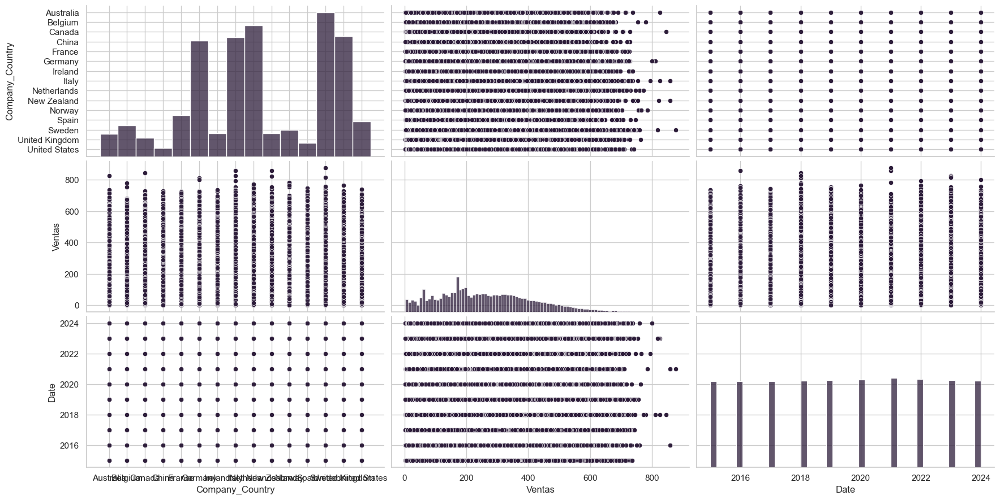

Podemos observar una mayor cantidad de ventas en el 2021 y por parte de Suecia, Nueva Zelanda e Italia


In [194]:
plt.figure(figsize=(20,20))
f = sns.pairplot(data_07, vars = [ "Company_Country", "Ventas", "Date" ], height=3, aspect=2)
plt.show()
print("Podemos observar una mayor cantidad de ventas en el 2021 y por parte de Suecia, Nueva Zelanda e Italia")

# Nivell 2

## 1. 
Representa la correlació d'algunes variables i interpreta els resultats segons les teves dades.

In [29]:
sql_connection = connection()
query_08 = ("SELECT  products.id AS Products, amount AS Ventas, COUNT(companies.country) AS Company_Country, COUNT(data_user.country) AS Users_Country, weight, price "
            "FROM transactions "
            "JOIN trans_prods "
            "ON transactions.id = transactions_id "
            "JOIN products "
            "ON product_id = products.id "
            "JOIN companies "
            "ON business_id = company_id "
            "JOIN credit_cards "
            "ON card_id = credit_cards.id "
            "JOIN data_user "
            "ON user_id = data_user.id "
            "GROUP BY Products, Ventas")
data_08 = pd.read_sql(query_08, sql_connection)
sql_connection.close()
data_08["price"] = data_08["price"].str.strip("$").astype(float)
data_08.corr()



,Products,Ventas,Company_Country,Users_Country,weight,price
Products,1.000000,-0.072587,-0.000404,-0.000404,0.016699,-0.157056
Ventas,-0.072587,1.000000,-0.092581,-0.092581,0.049171,0.454110
Company_Country,-0.000404,-0.092581,1.000000,1.000000,0.000273,0.001014
Users_Country,-0.000404,-0.092581,1.000000,1.000000,0.000273,0.001014
weight,0.016699,0.049171,0.000273,0.000273,1.000000,0.104844
price,-0.157056,0.454110,0.001014,0.001014,0.104844,1.000000


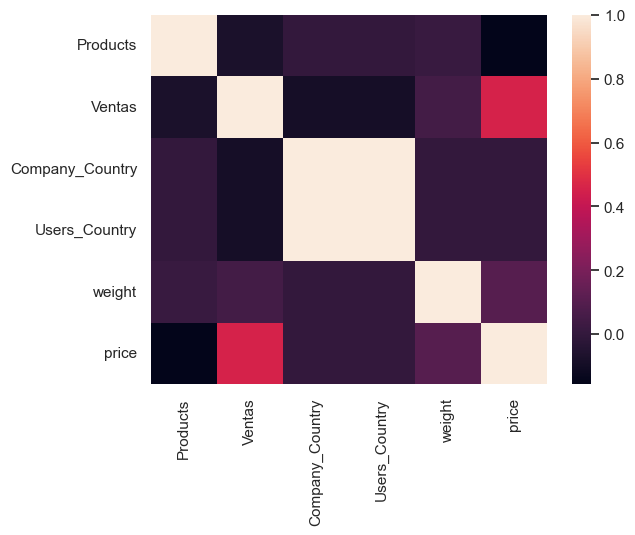

Podemos observar que la correlación más alta es entre las ventas y el precio de los productos,
esto nos indica que cuanto más aumenta el precio de los productos más aumenta el dinero gastado por transacción


In [30]:
sns.heatmap(data_08.corr())
plt.show()
print("Podemos observar que la correlación más alta es entre las ventas y el precio de los productos,\nesto nos indica que cuanto más aumenta el precio de los productos más aumenta el dinero gastado por transacción")

## 2. 
Implementa un Jointplot per explorar la relació entre dues variables i interpreta els resultats segons les teves dades.

In [32]:
sql_connection = connection()
query_09 = ("SELECT   weight, price "
            "FROM products "
           "ORDER BY weight")
data_09 = pd.read_sql(query_09, sql_connection)
data_09["price"] = data_09["price"].str.strip("$").astype(float)
sql_connection.close()
data_09

,weight,price
0,0.6,59.76
1,0.6,132.86
2,0.6,63.33
3,0.6,195.94
4,0.6,3.83
...,...,...
95,3.2,167.20
96,3.2,137.81
97,3.2,121.91
98,3.2,171.22


<Figure size 2000x2000 with 0 Axes>

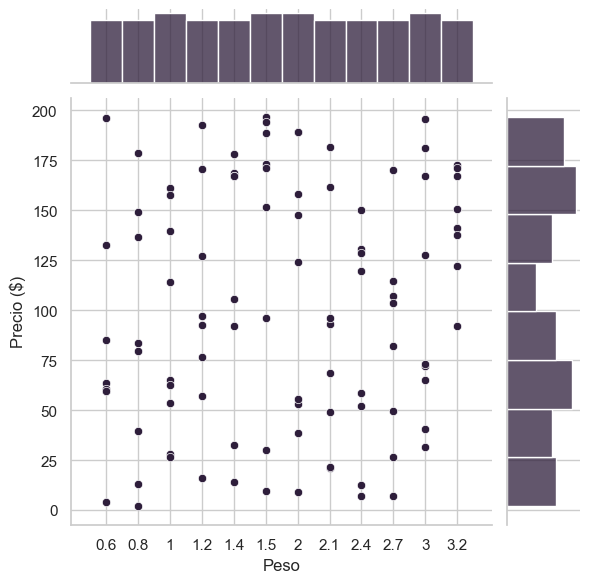

Observamos que el precio y el peso no tienen una correlación clara, aunque los productos de peso 3.2 se mantienen entre 75$ y 175$


In [33]:
plt.figure(figsize=(20,20))
sns.jointplot(data=data_09, x="weight", y="price")
plt.xlabel("Peso")
plt.ylabel("Precio ($)") 
plt.show()
print("Observamos que el precio y el peso no tienen una correlación clara, aunque los productos de peso 3.2 se mantienen entre 75$ y 175$")

# Nivell 3

## 1. 
Transfereix totes les visualitzacions del Nivell 1 a Power BI utilitzant scripts de Python.

Recorda: quan carreguis els teus dataframes a Power BI, assegura't d’incloure una columna identificadora o una combinació de columnes que garanteixi la unicitat de cada registre. Per defecte, Power BI elimina duplicats i podries perdre informació.